## Clustering - CB1 ligands

In [1]:
from rdkit.Chem.Draw import IPythonConsole
from rdkit.Chem import AllChem as Chem
from rdkit import DataStructs
from rdkit.Chem import Lipinski
from rdkit.Chem import rdMolDescriptors
from rdkit.Chem import Descriptors
from rdkit.SimDivFilters.rdSimDivPickers import MaxMinPicker
from matplotlib import pyplot
import seaborn
from scipy.spatial import distance
from sklearn import manifold
from sklearn import decomposition
from sklearn import preprocessing
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import KMeans
import pandas as pd
import csv
import re

RDKit WARNING: [11:54:07] Enabling RDKit 2019.09.3 jupyter extensions


In [8]:
float_pattern = re.compile("[0-9]+(\.[0-9]*)?")
lip_func = [("HBA", Lipinski.NumHAcceptors), ("HBD", Lipinski.NumHDonors), ("MW", Descriptors.ExactMolWt),
            ("LogP", Descriptors.MolLogP), ("TPSA", rdMolDescriptors.CalcTPSA), ("RB", Lipinski.NumRotatableBonds)]
with open("cannabinoid.csv") as inp:
    cannabinoid = [row for row in csv.DictReader(inp, delimiter=";", quotechar='"')]
    for m in cannabinoid:
        m["rdmol"] = Chem.MolFromSmiles(m["Smiles"])
        m["source"] = "cannabinoid"
        m["pChEMBL_value"] = float(m["pChEMBL Value"]) if float_pattern.match(m["pChEMBL Value"]) else 0
        m["fps"] = Chem.GetMorganFingerprintAsBitVect(m["rdmol"],2,nBits=1024)
        for f in lip_func:
            m[f[0]] = f[1](m["rdmol"])

In [10]:
%%capture
drugbank = [{"rdmol": m,
             "source": "drugbank",
             "Smiles": Chem.MolToSmiles(m),
             "pChEMBL_value": 0,
             "fps": Chem.GetMorganFingerprintAsBitVect(m, 2, nBits=1024),
             **{f[0]: f[1](m) for f in lip_func}
            } for m in Chem.SDMolSupplier("../data/drugbank.sdf") if m
           ]

In [11]:
df = pd.DataFrame((*drugbank, *cannabinoid), columns=["Smiles", "source", "rdmol", "fps", "pChEMBL_value", *(f[0] for f in lip_func)])
df.reset_index(level=0, inplace=True)

In [12]:
df = df.join(pd.DataFrame((rdMolDescriptors.MQNs_(mol) for mol in df["rdmol"]),
                          columns=[*(f"MQN_{x}" for x in range(1,43))])
            )

In [13]:
norm = preprocessing.normalize(df[(f"MQN_{x}" for x in range(1, 43))])
pca = decomposition.PCA(n_components=42)
pca.fit(norm)
df = df.join(pd.DataFrame(pca.transform(norm), columns=[f"nPCA_{x}" for x in range(1, 43)]))

In [14]:
sparse_mat = distance.pdist(list(df["fps"]),metric="jaccard")
dist_mat = distance.squareform(sparse_mat)

In [15]:
clf = manifold.MDS(n_components=2, n_init=1, max_iter=100, dissimilarity="precomputed")
X_mds = clf.fit_transform(dist_mat)
df = df.join(pd.DataFrame(X_mds, columns=["mds_x","mds_y"]))

In [16]:
clf = manifold.TSNE(n_components=2, metric="precomputed")
X_tsne = clf.fit_transform(dist_mat)
df = df.join(pd.DataFrame(X_tsne, columns=["tsne_x", "tsne_y"]))

C:\Users\katka\anaconda3\envs\cdd\lib\site-packages\sklearn\manifold\_t_sne.py:699: FutureWarning: 'square_distances' has been introduced in 0.24 to help phase out legacy squaring behavior. The 'legacy' setting will be removed in 1.1 (renaming of 0.26), and the default setting will be changed to True. In 1.3, 'square_distances' will be removed altogether, and distances will be squared by default. Set 'square_distances'=True to silence this warning.
  FutureWarning


## Hierarchical clustering

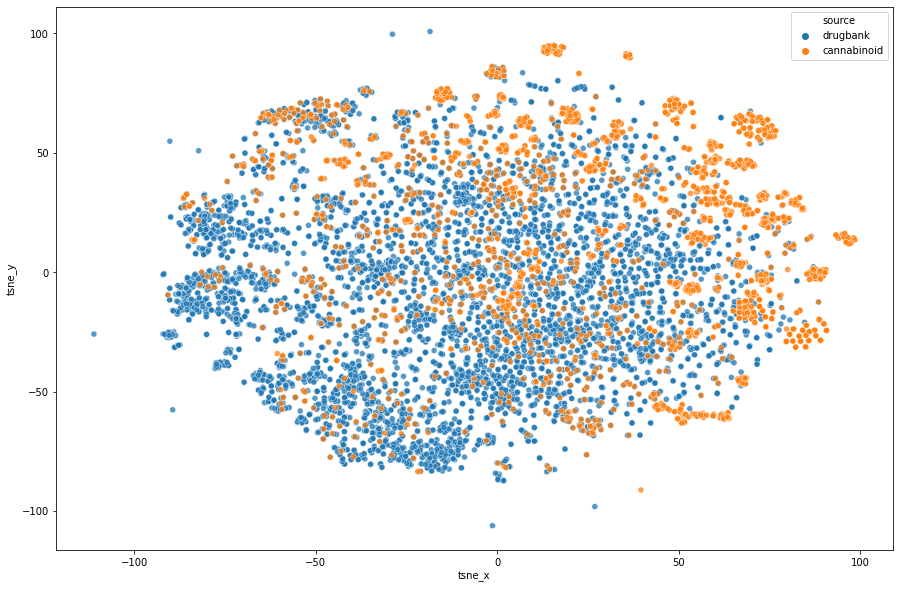

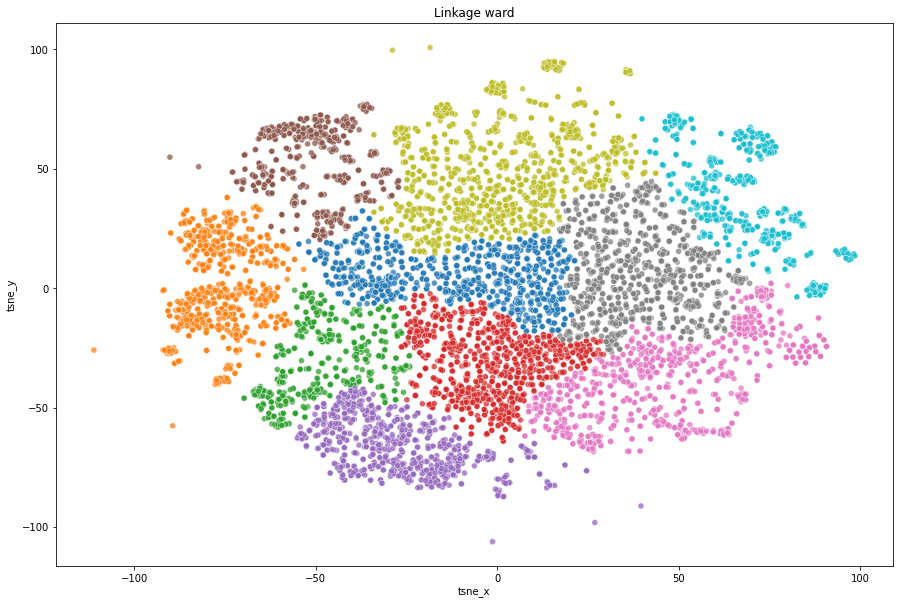

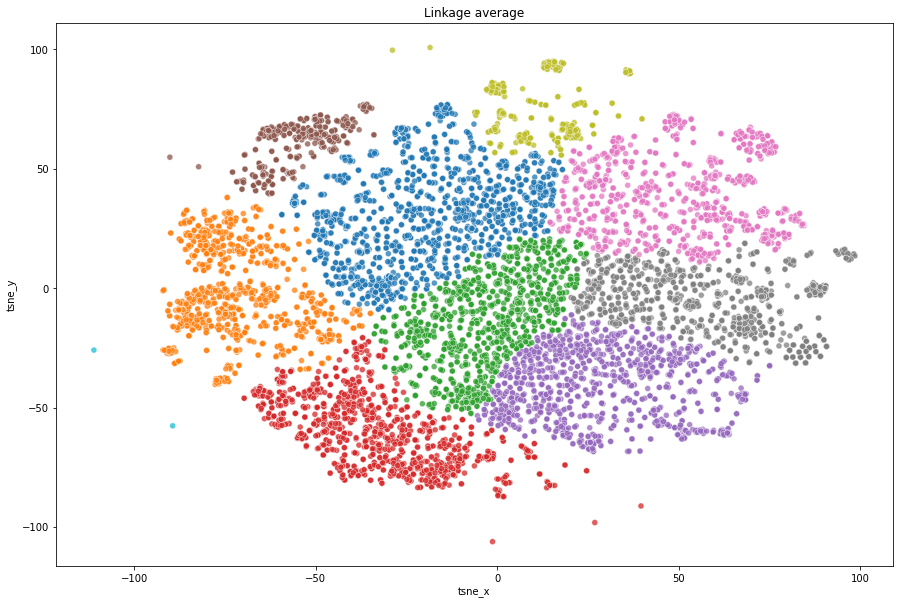

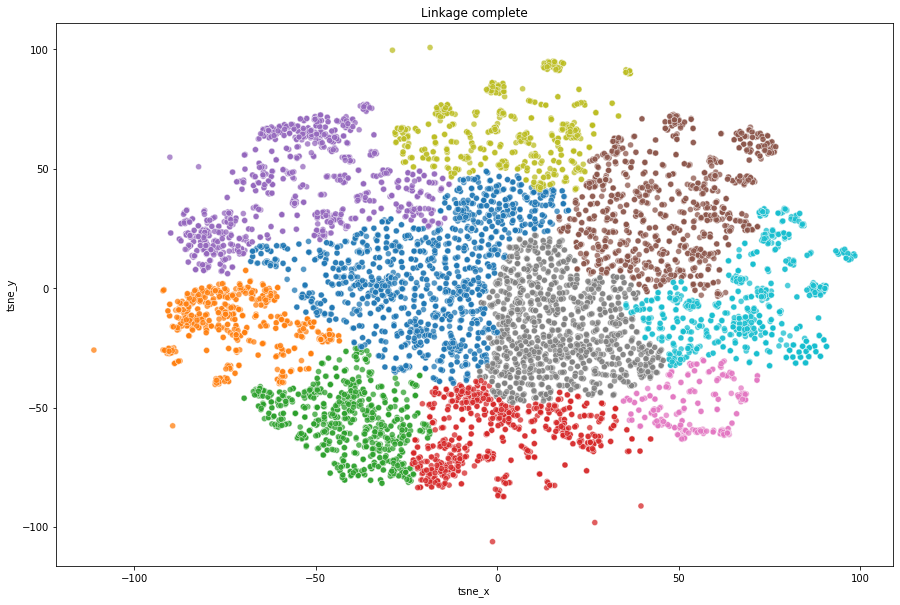

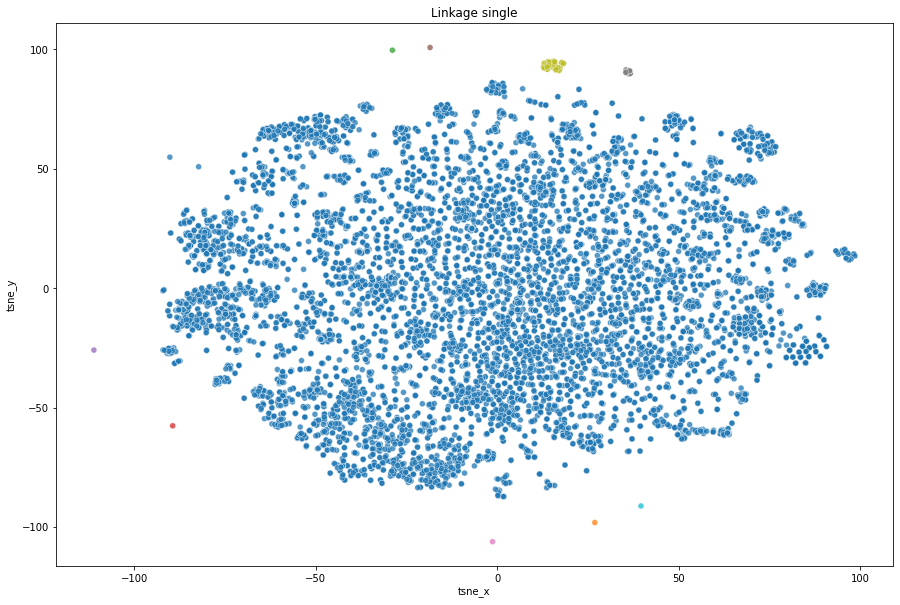

In [17]:
fig, ax = pyplot.subplots(figsize=(15,10))
p=seaborn.scatterplot(x="tsne_x",
                      y="tsne_y",
                      data=df,
                      hue="source",
                      legend="brief",
                      ax=ax,
                      alpha=0.75
                     )

for linkage in ('ward', 'average', 'complete', 'single'):
    clustering = AgglomerativeClustering(linkage=linkage, n_clusters=10)
    clustering.fit(df[["tsne_x", "tsne_y"]])

    fig, ax = pyplot.subplots(figsize=(15,10))
    p=seaborn.scatterplot(x="tsne_x",
                      y="tsne_y",
                      data=df,
                      hue=[pyplot.cm.nipy_spectral(l / 10.) for l in clustering.labels_],
                      ax=ax,
                      alpha=0.75,
                      legend=False
                     ).set_title(f"Linkage {linkage}")

''

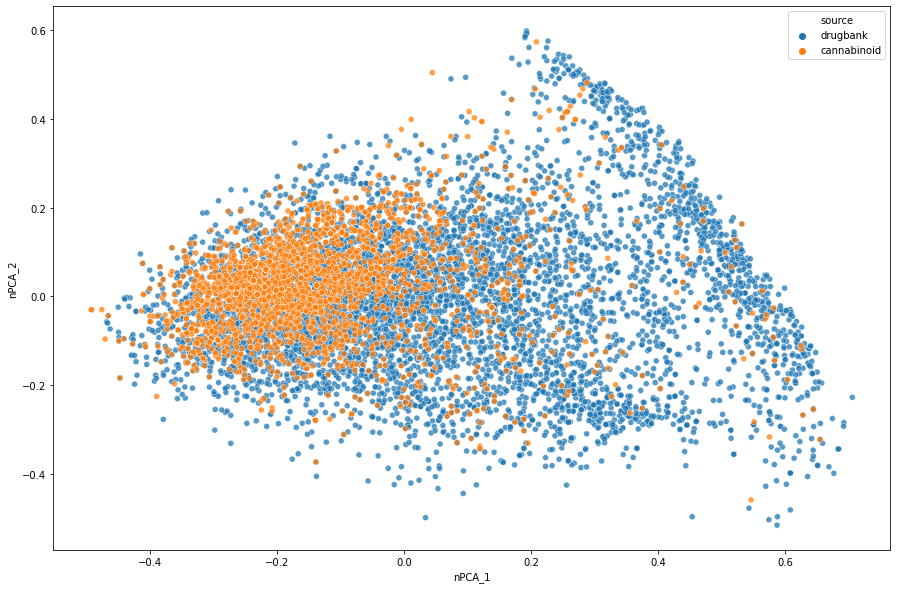

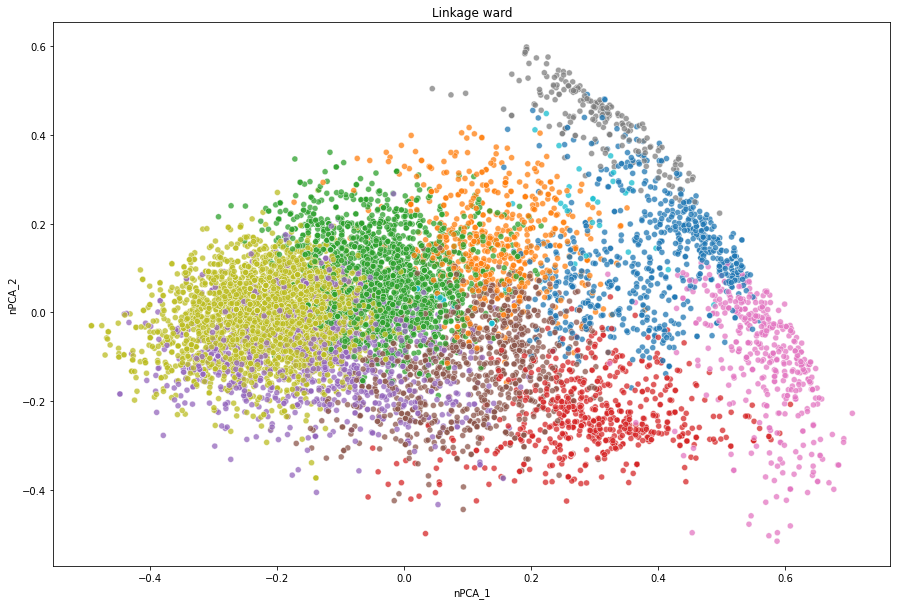

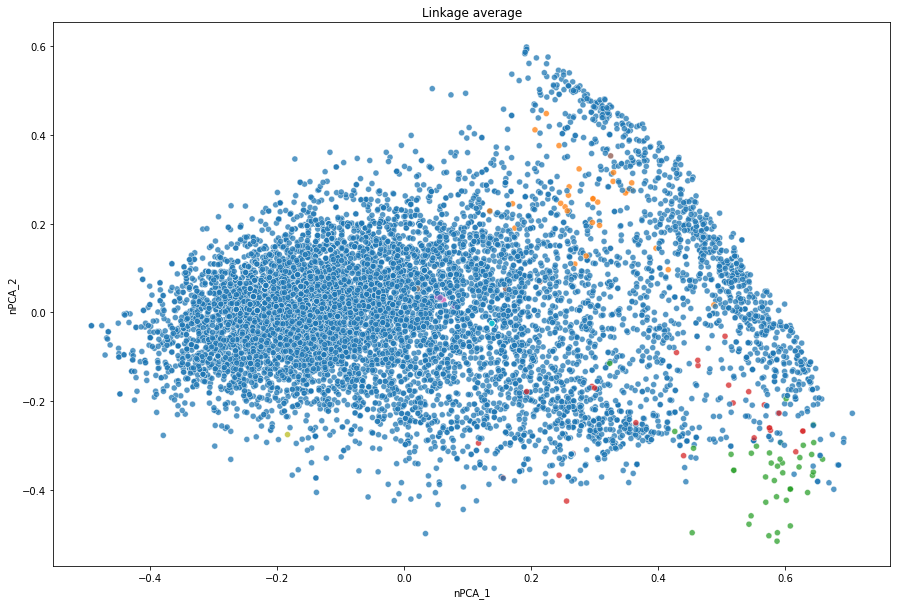

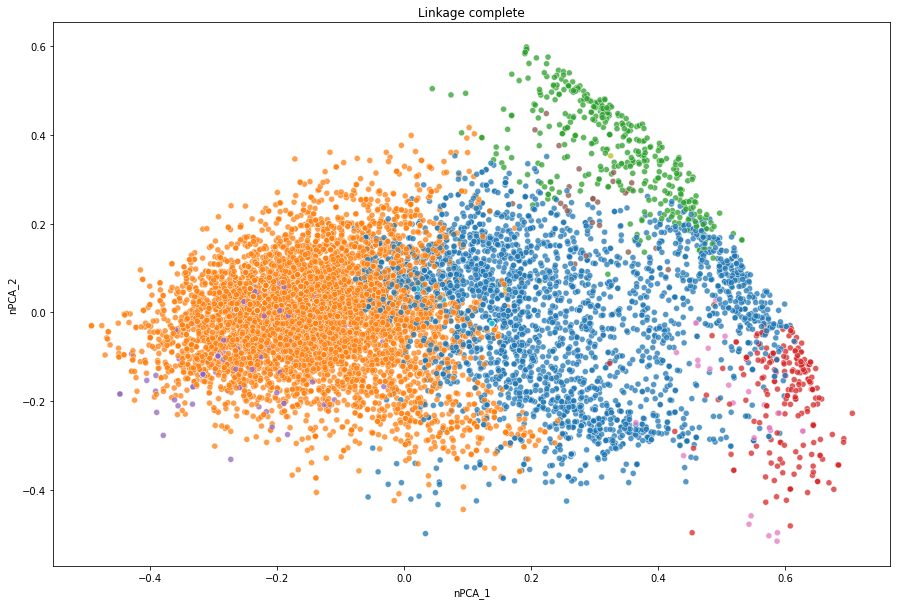

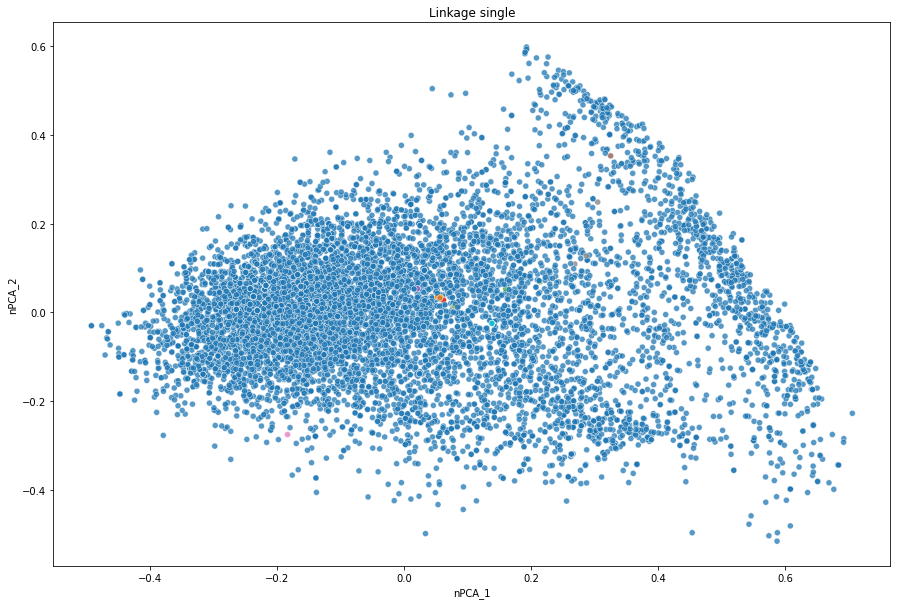

In [18]:
fig, ax = pyplot.subplots(figsize=(15,10))
p=seaborn.scatterplot(x="nPCA_1",
                      y="nPCA_2",
                      data=df,
                      hue="source",
                      legend="brief",
                      ax=ax,
                      alpha=0.75
                     )

for linkage in ('ward', 'average', 'complete', 'single'):
    clustering = AgglomerativeClustering(linkage=linkage, n_clusters=10)
    clustering.fit(df[[f"nPCA_{x}" for x in range(1, 43)]])

    fig, ax = pyplot.subplots(figsize=(15,10))
    p=seaborn.scatterplot(x="nPCA_1",
                      y="nPCA_2",
                      data=df,
                      hue=[pyplot.cm.nipy_spectral(l / 10.) for l in clustering.labels_],
                      ax=ax,
                      alpha=0.75,
                      legend=False,
                     ).set_title(f"Linkage {linkage}")
''

## K-mean clustering

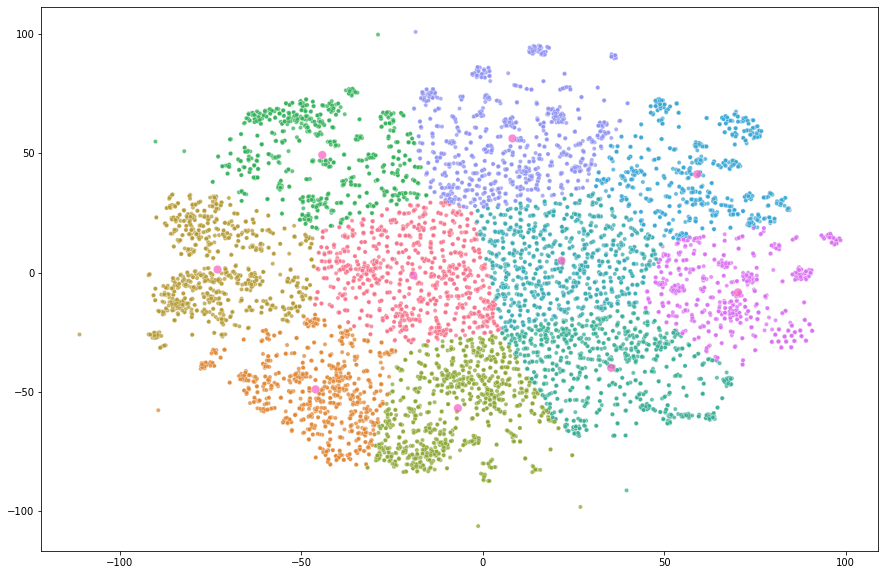

In [19]:
reduced_data = df[["tsne_x", "tsne_y"]]
n_clusters = 10
kmeans = KMeans(init="k-means++", n_clusters=n_clusters, n_init=4)
kmeans.fit(reduced_data)
centroids = kmeans.cluster_centers_
# Put the result into a color plot
fig, ax = pyplot.subplots(figsize=(15,10))
p=seaborn.scatterplot(x= [*df["tsne_x"], *centroids[:, 0]],
                  y=[*df["tsne_y"], *centroids[:, 1]],
                  hue=[pyplot.cm.nipy_spectral(l / (n_clusters+1)) for l in (*kmeans.labels_, *(n_clusters for x in range(len(centroids))))],
                  size=[*[1 for l in kmeans.labels_],*[50 for x in range(len(centroids))]],
                  ax=ax,
                  alpha=0.75,
                  legend=False 
                 )



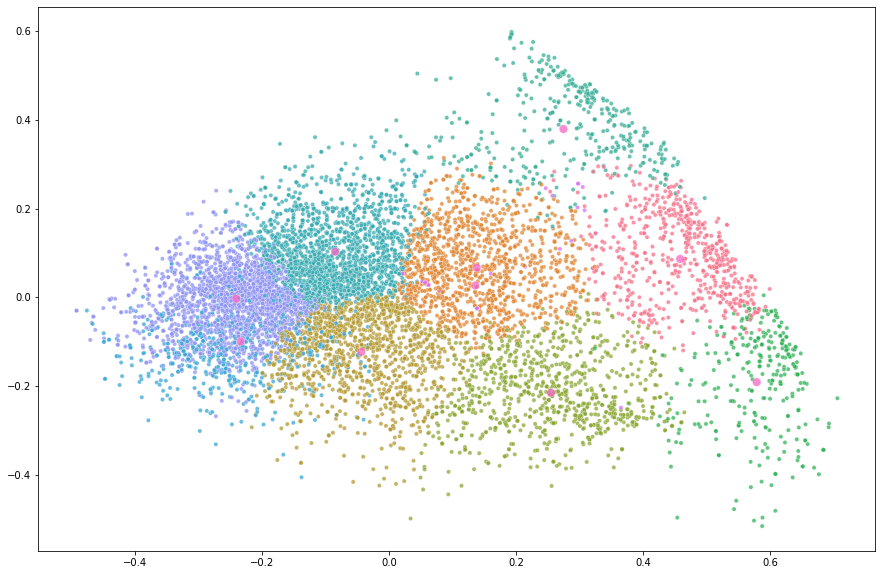

In [20]:
reduced_data = df[[f"nPCA_{x}" for x in range(1, 43)]]
n_clusters = 10
kmeans = KMeans(init="k-means++", n_clusters=n_clusters, n_init=4)
kmeans.fit(reduced_data)
centroids = kmeans.cluster_centers_

# Put the result into a color plot
fig, ax = pyplot.subplots(figsize=(15,10))
p=seaborn.scatterplot(x= [*df["nPCA_1"], *centroids[:, 0]],
                  y=[*df["nPCA_2"], *centroids[:, 1]],
                  hue=[pyplot.cm.nipy_spectral(l / (n_clusters+3)) for l in (*kmeans.labels_, *(n_clusters for x in range(len(centroids))))],
                  size=[*[1 for l in kmeans.labels_],*[50 for x in range(len(centroids))]],
                  ax=ax,
                  alpha=0.75,
                  legend=False 
                 )

## Agglomerative Clustering

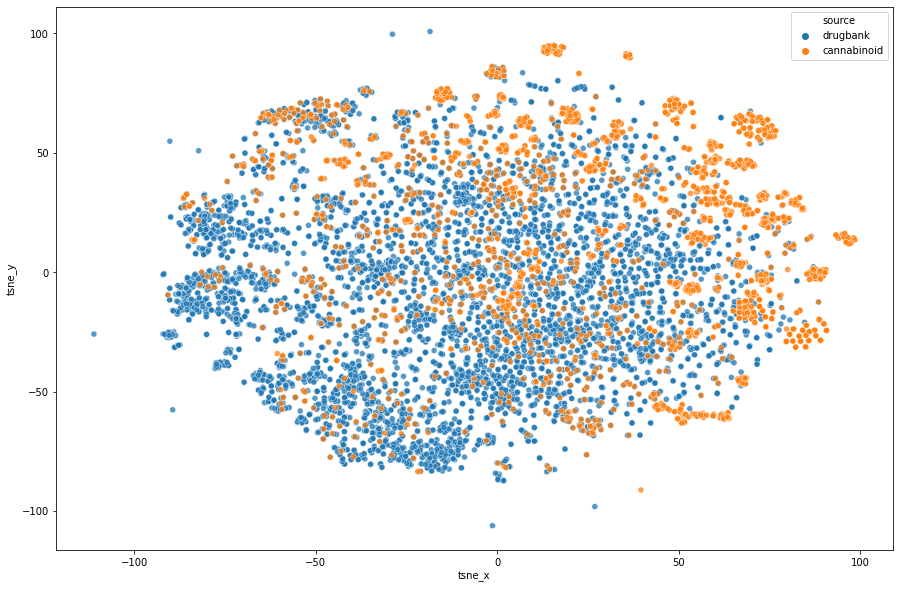

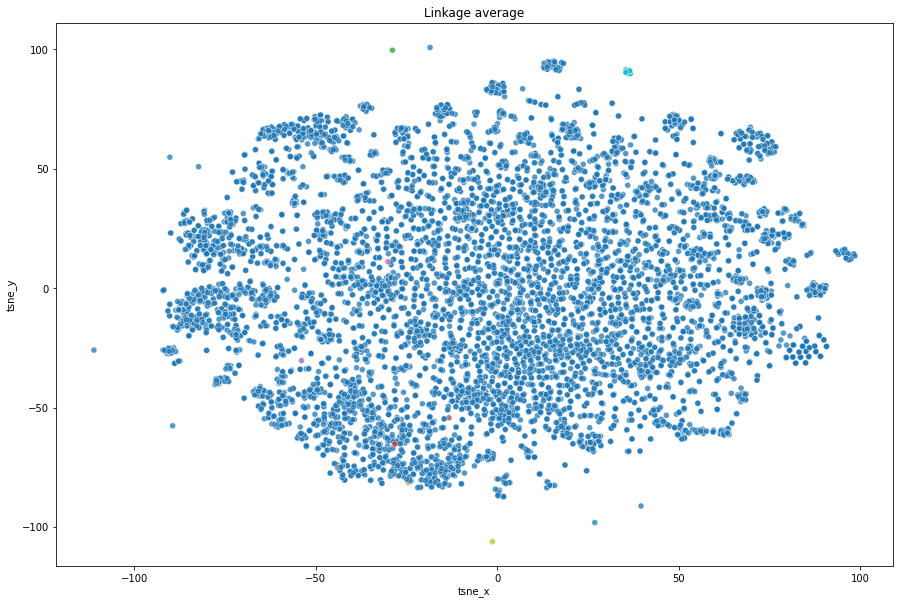

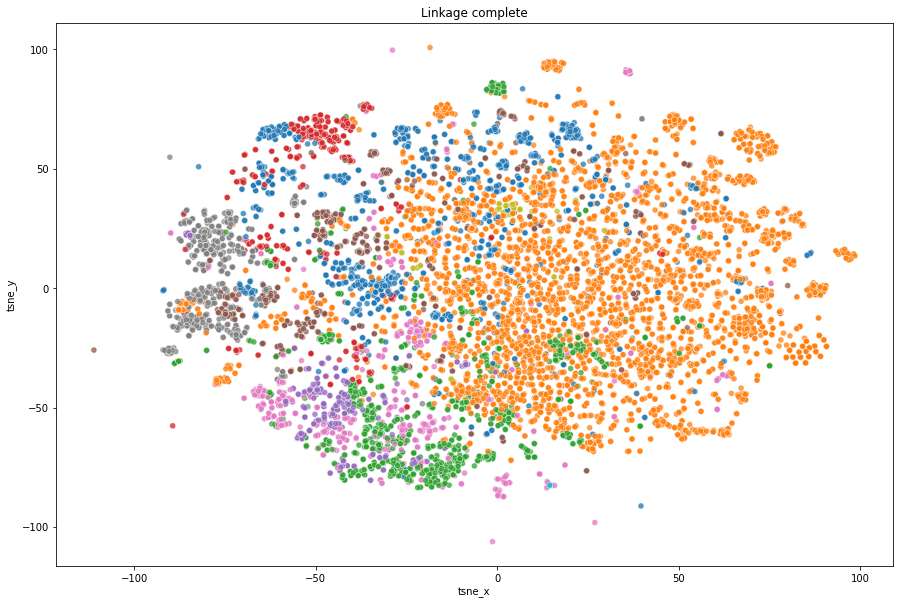

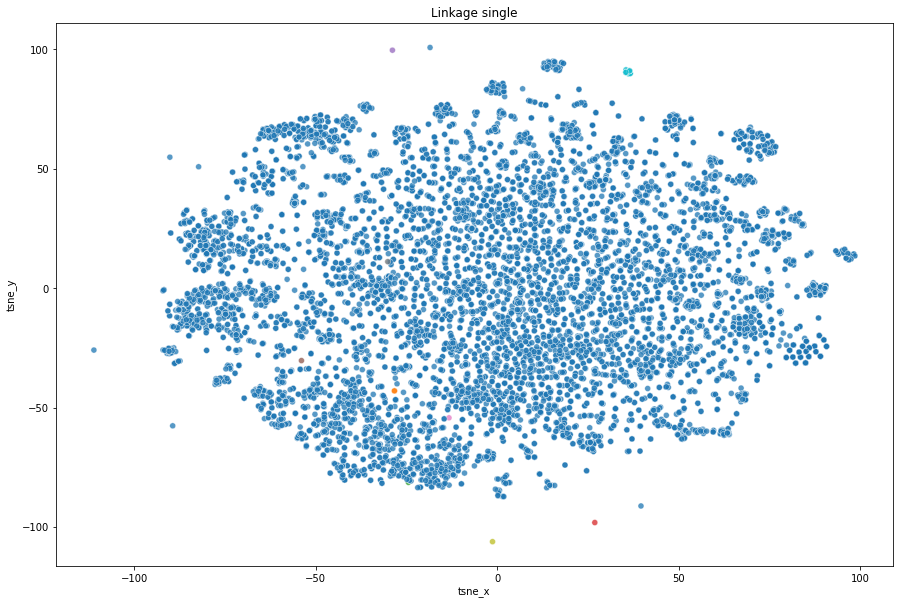

In [21]:
n_clusters = 10
fig, ax = pyplot.subplots(figsize=(15,10))
p=seaborn.scatterplot(x="tsne_x",
                      y="tsne_y",
                      data=df,
                      hue="source",
                      legend="brief",
                      ax=ax,
                      alpha=0.75
                     )

for linkage in ('average', 'complete', 'single'):
    clustering = AgglomerativeClustering(linkage=linkage, affinity="precomputed", n_clusters=n_clusters)
    clustering.fit(dist_mat)

    fig, ax = pyplot.subplots(figsize=(15,10))
    p=seaborn.scatterplot(x="tsne_x",
                      y="tsne_y",
                      data=df,
                      hue=[pyplot.cm.nipy_spectral(l / n_clusters) for l in clustering.labels_],
                      ax=ax,
                      alpha=0.75,
                      legend=False,
                     ).set_title(f"Linkage {linkage}")

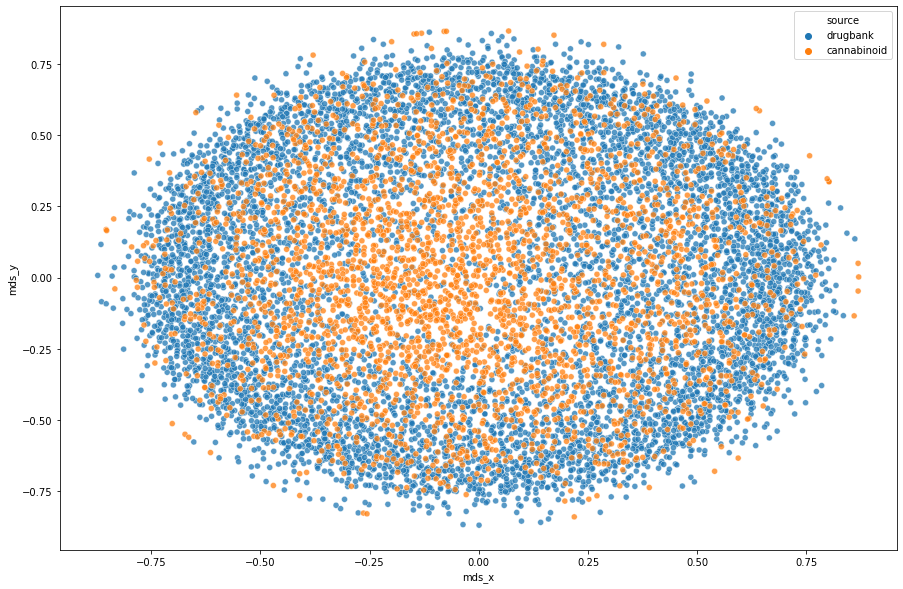

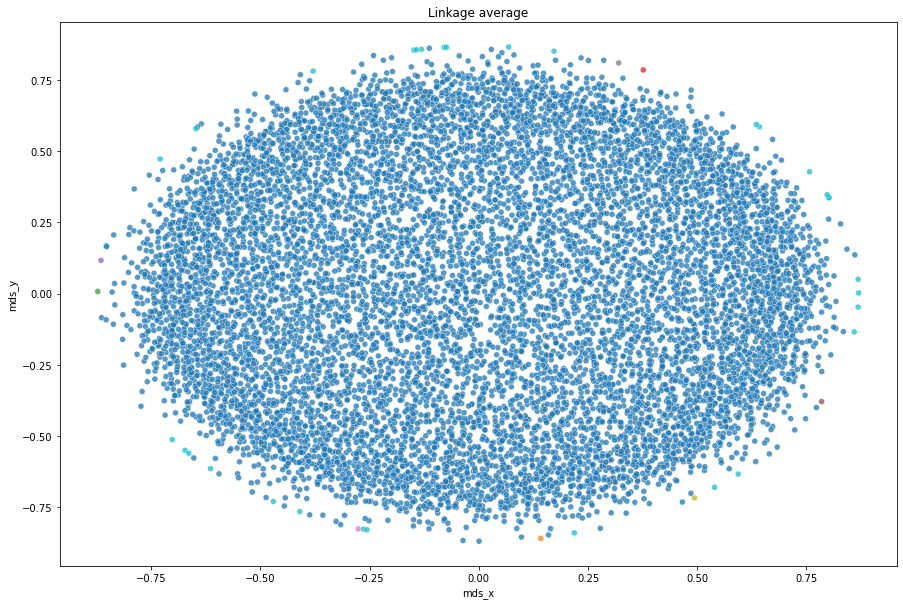

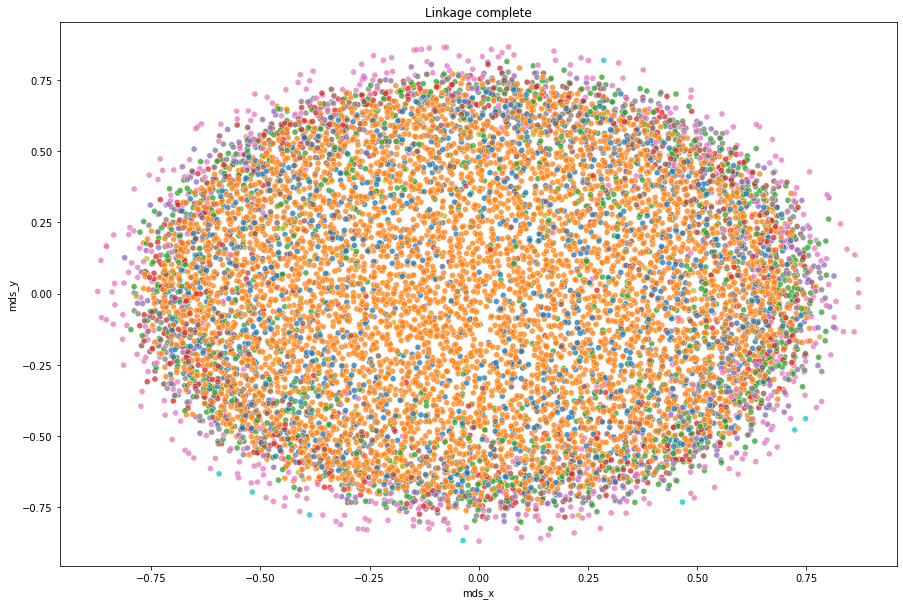

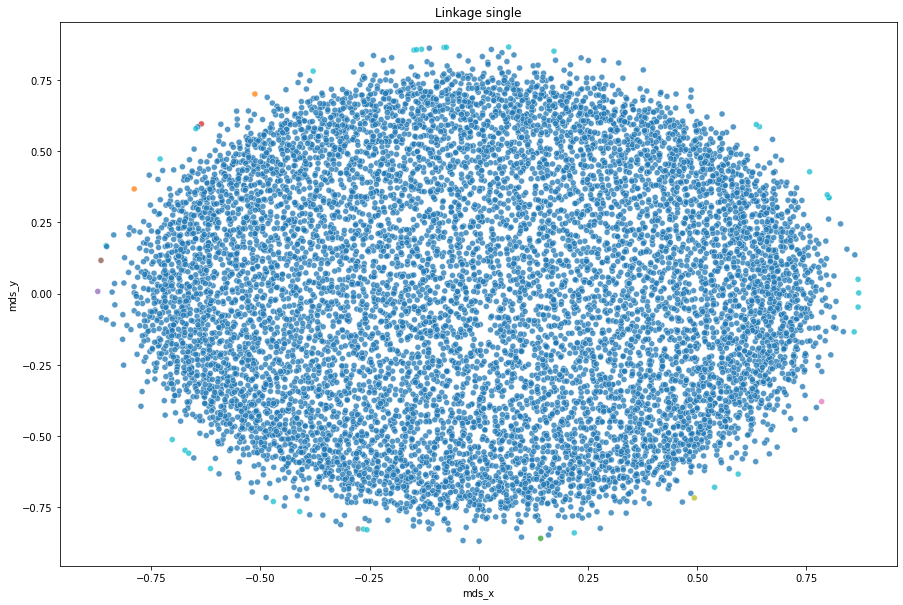

In [22]:
fig, ax = pyplot.subplots(figsize=(15,10))
p=seaborn.scatterplot(x="mds_x",
                      y="mds_y",
                      data=df,
                      hue="source",
                      legend="brief",
                      ax=ax,
                      alpha=0.75
                     )

for linkage in ('average', 'complete', 'single'):
    clustering = AgglomerativeClustering(linkage=linkage, affinity="precomputed", n_clusters=n_clusters)
    clustering.fit(dist_mat)

    fig, ax = pyplot.subplots(figsize=(15,10))
    p=seaborn.scatterplot(x="mds_x",
                      y="mds_y",
                      data=df,
                      hue=[pyplot.cm.nipy_spectral(l / n_clusters) for l in clustering.labels_],
                      ax=ax,
                      alpha=0.75,
                      legend=False,
                     ).set_title(f"Linkage {linkage}")